<a href="https://colab.research.google.com/github/elisabethpose30/procesamientodigitaldeimagenes/blob/main/TP_imagenesElisabethPoseultima.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Ejercicios de Procesamiento Digital de Imágenes**

# **EJERCICIO 1: ESPACIOS DE COLOR**

Usando una imagen a color de su elección:

a) Cargar la imagen con OpenCV y mostrar los canales BGR por separado.
b) Identificar cuál de los tres canales tiene mayor información basándose en los valores promedio.
c) Convertir la imagen de BGR a RGB y explicar por qué los colores se ven diferentes antes y después de la conversión.


# a) Cargar la imagen con OpenCV y mostrar los canales BGR por separado.

IMPORTO LAS LIBRERIAS A UTILIZAR

In [5]:
import cv2 #trayendo todas las funciones que te permiten trabajar con imágenes, videos y visión por computadora.
from cv2 import imread #Leer imágenes
import random #permite trabajar con valores aleatorios.
import numpy as np
import urllib.request #sirve para trabajar con URLs en Python, como si estuvieras usando un navegador para descargar cosas.
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

*DESCARGO LA IMAGEN QUE VOY A UTILIZAR*

In [6]:
!wget ""/content/c6ca166b3c9a7f5deb696a710bba5147.jpg""

/content/c6ca166b3c9a7f5deb696a710bba5147.jpg: Scheme missing.


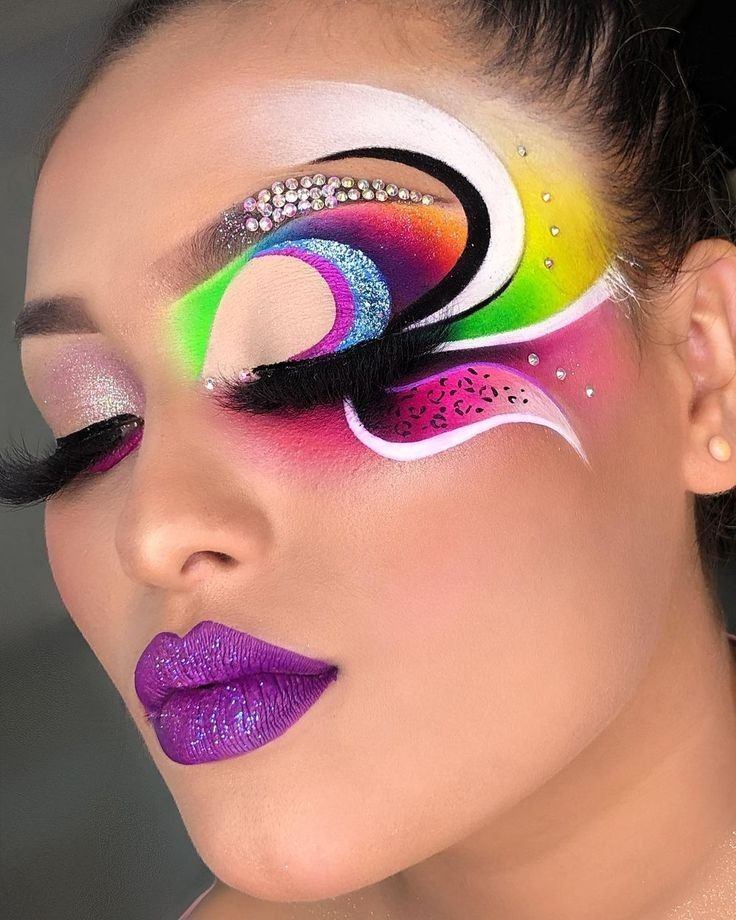

In [8]:
from PIL import Image #Es una biblioteca para abrir, modificar y guardar imágenes en muchos formatos (JPEG, PNG, GIF, etc.).
from IPython.display import display#permite mostrar objetos en una celda de manera más flexible y enriquecida

img = Image.open("/content/maquillajeintegrador.jpg")
display(img)


EN EL SIGUIENTE PASO VOY A LEER LA IMAGEN CON OPEN CV, MUESTRO LA INFORMACION DE LA IMAGEN QUE ELEGI Y POSTERIORMENTE MUESTRO MI IMAGEN.

Dimensiones de la imagen: (920, 736, 3)
Tipo de datos: uint8
Tamaño en memoria (bytes): 2031360


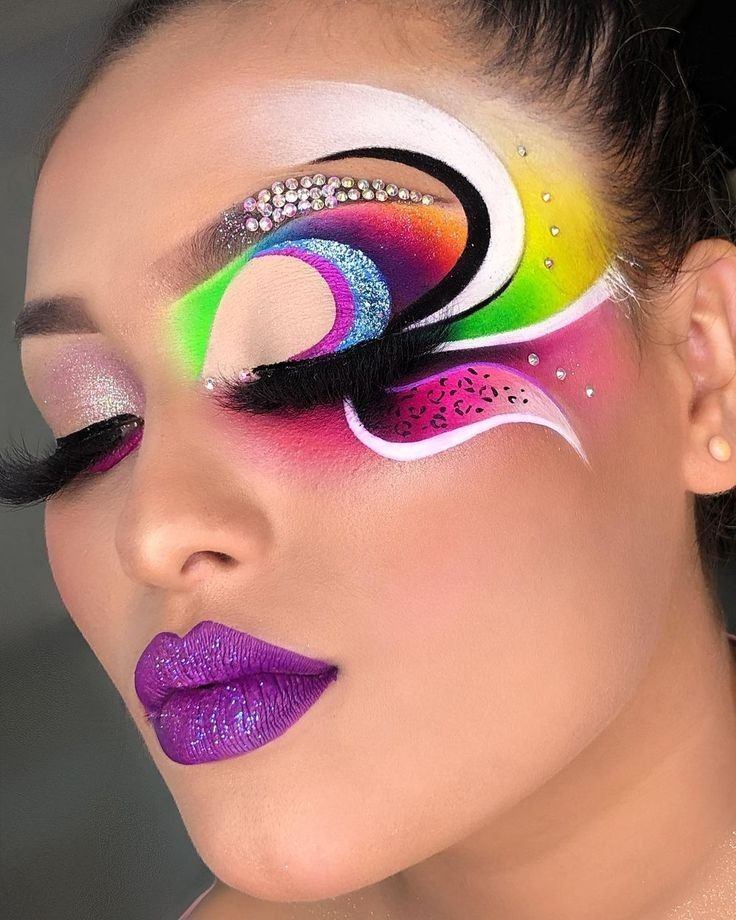

In [9]:
# Lectura de imagen usando OpenCV
imagen_bgr = cv2.imread('/content/maquillajeintegrador.jpg')

# Información básica de la imagen
print("Dimensiones de la imagen:", imagen_bgr.shape)
print("Tipo de datos:", imagen_bgr.dtype)
print("Tamaño en memoria (bytes):", imagen_bgr.nbytes)

# Visualización de la imagen completa
cv2_imshow(imagen_bgr)

AHORA VAMOS A SEPARAR LOS 3 CANALES : EN BGR EL CANAL 0 ES AZUL EL 1 ES VERDE Y EL 2 ES ROJO.

OPEN CV POR DEFECTO VA A MAPEAR LOS CANALES EN ESCALA DE GRISES.
MAS BLANCO: MAS INTENSIDAD DE ESE COLOR
MAS OSCURO: MENOS INTENSIDAD DE ESE COLOR


Estadísticas del canal Azul:
Valor mínimo: 0, Valor máximo: 255, Promedio: 112.23


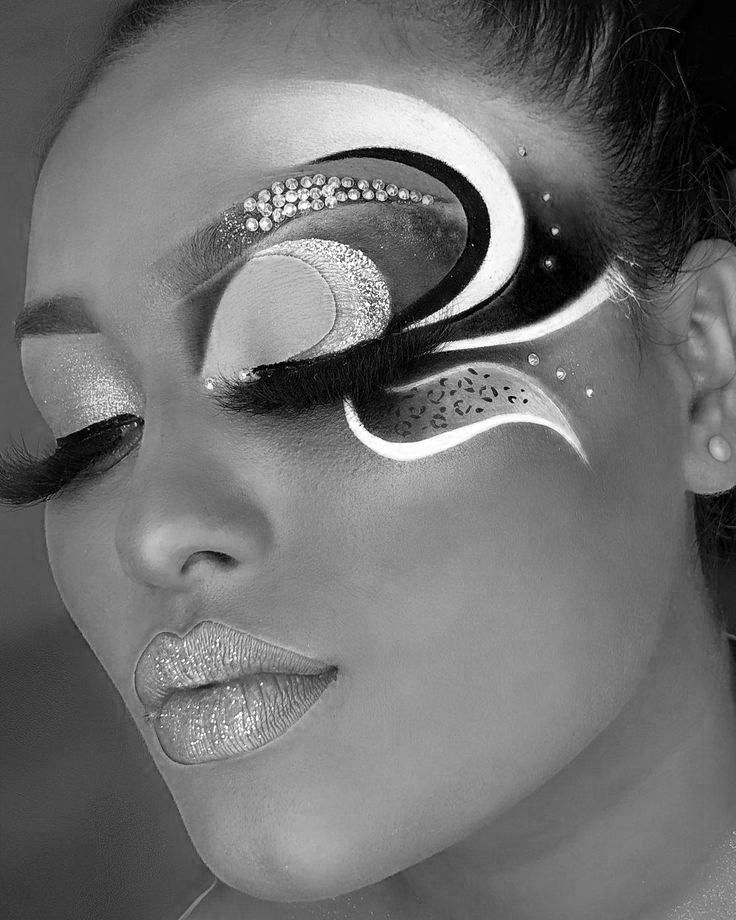

In [10]:
# Canal Azul (B)
B = imagen_bgr[:,:,0]
print("Estadísticas del canal Azul:")
print(f"Valor mínimo: {B.min()}, Valor máximo: {B.max()}, Promedio: {B.mean():.2f}")
cv2_imshow(B)


Estadísticas del canal Verde:
Valor mínimo: 0, Valor máximo: 255, Promedio: 126.53


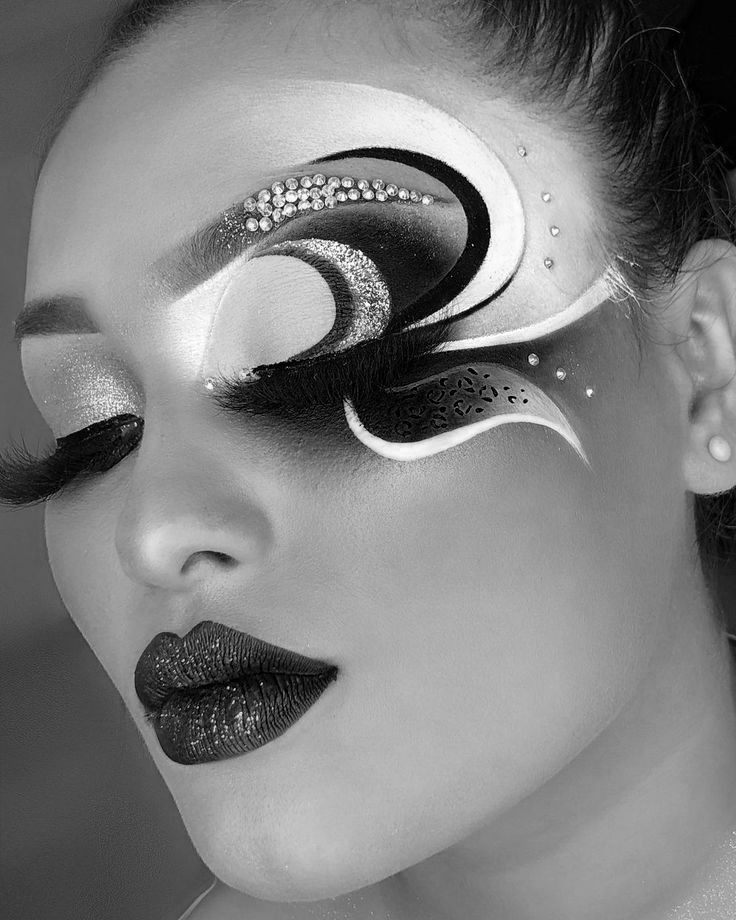

In [11]:
# Canal Verde (G)
G = imagen_bgr[:,:,1]
print("\nEstadísticas del canal Verde:")
print(f"Valor mínimo: {G.min()}, Valor máximo: {G.max()}, Promedio: {G.mean():.2f}")
cv2_imshow(G)


Estadísticas del canal Rojo:
Valor mínimo: 0, Valor máximo: 255, Promedio: 174.09


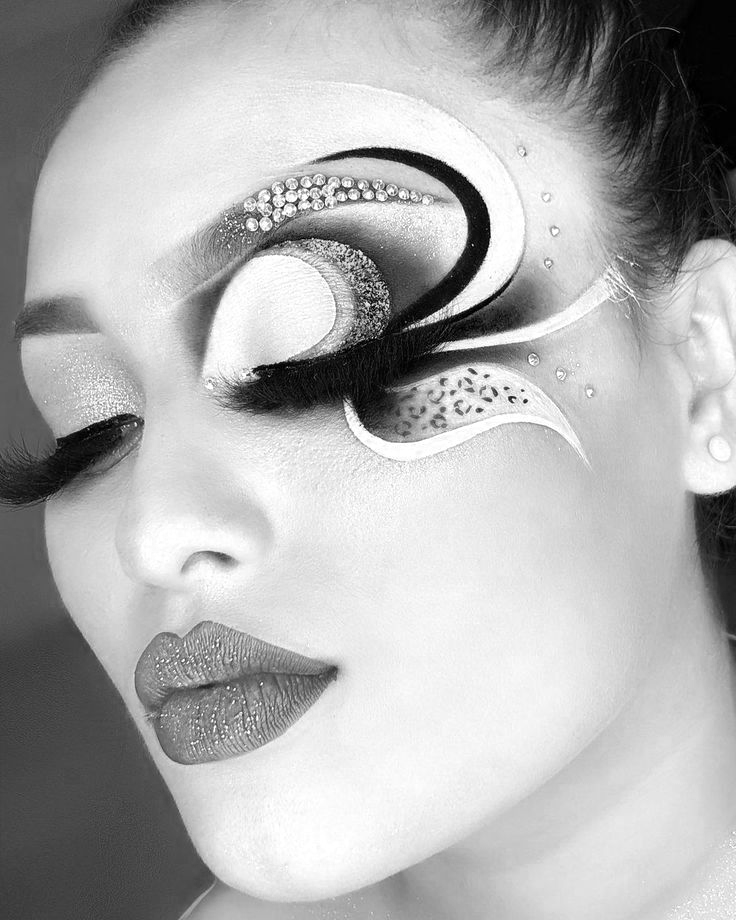

In [12]:
# Canal Rojo (R)
R = imagen_bgr[:,:,2]
print("\nEstadísticas del canal Rojo:")
print(f"Valor mínimo: {R.min()}, Valor máximo: {R.max()}, Promedio: {R.mean():.2f}")
cv2_imshow(R)

# b) Identificar cuál de los tres canales tiene mayor información basándose en los valores promedio.

PARA PODER HACER EL PROMEDIO UTILIZAMOS LA FUNCION MEAN YA QUE HACE EL PROMEDIO DE TODOS LOS VALORES CORRESPONDIENTES A ESE CANAL QUE ESTAMOS TRABAJANDO (AZUL, VERDE O ROJO CORRESPONDIENTEMENTE)

In [13]:
promazul = B.mean()
promverde = G.mean()
promrojo = R.mean()

print("Promedio de azul: " + str(promazul))
print("Promedio de verde: " + str(promverde))
print("Promedio de rojo: " + str(promrojo))

if promrojo > promverde and promrojo > promazul:
    print("El canal con mayor información es el rojo")
elif promverde > promazul:
    print("El canal con mayor información es el verde")
else:
    print("El canal con mayor información es el azul")


Promedio de azul: 112.22595699432893
Promedio de verde: 126.53086749763705
Promedio de rojo: 174.08534823960304
El canal con mayor información es el rojo


# c) Convertir la imagen de BGR a RGB y explicar por qué los colores se ven diferentes antes y después de la conversión.

In [14]:
# Demostración de conversión BGR a RGB
imagen_bgr = cv2.imread('/content/maquillajeintegrador.jpg')
imagen_rgb = cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB)

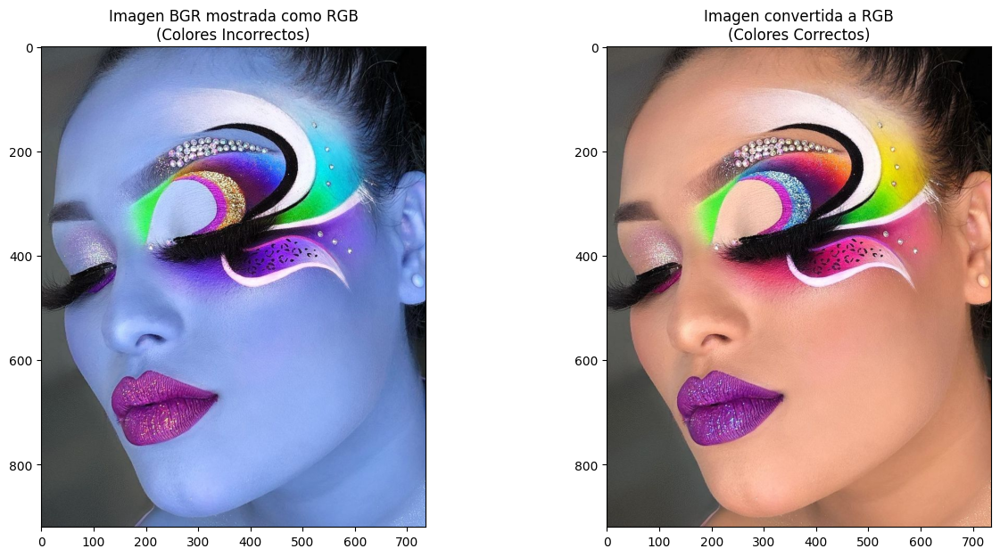

In [15]:
# Visualización comparativa
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,7))

ax1.imshow(imagen_bgr)
ax1.set_title('Imagen BGR mostrada como RGB\n(Colores Incorrectos)')

ax2.imshow(imagen_rgb)
ax2.set_title('Imagen convertida a RGB\n(Colores Correctos)')

plt.show()

**Los colores se ven diferentes antes y después de la conversión porque OpenCV carga las imágenes en formato BGR (azul, verde, rojo), mientras que la mayoría de los visores y librerías como Matplotlib utilizan el formato RGB (rojo, verde, azul); por eso, si mostramos una imagen en BGR sin convertirla a RGB, los canales de color están invertidos y los colores se ven alterados (por ejemplo, un rojo puede verse azul), y al aplicar la conversión con se corrige el orden de los canales, logrando una visualización correcta.**

#**Ejercicio 2: Muestreo y Cuantización**


a) Aplicar muestreo espacial a una imagen con factores de 2, 4 y 8.
b) Para cada caso, calcular:
El nuevo tamaño de la imagen
El porcentaje de reducción de datos
c) Aplicar cuantización con 4 niveles diferentes (32, 64, 128, 256)
d) ¿En qué nivel de cuantización comienza a ser visible la degradación de la imagen?**

MUESTREO: es el proceso de convertir una imagen continua en una matriz de píxeles.Cada píxel representará una porción de la imagen en una cuadrícula, y la resolución de la imagen depende de la cantidad de puntos de muestreo que tomes.
La cuantización es el proceso de asignar valores discretos a cada muestra tomada durante el muestreo. En términos más simples, es el proceso de convertir las intensidades de color de cada píxel en valores específicos dentro de un rango determinado.
Muestreo afecta la resolución espacial: es decir, cuántos píxeles tomas de la imagen.

Cuantización afecta la resolución tonal: es decir, cuántos niveles de color o intensidad puedes representar en cada píxel.

# a) Aplicar muestreo espacial a una imagen con factores de 2, 4 y 8.

CAMBIE LA IMAGEN A UTILIZAR ASI QUE LA CARGO:

In [16]:
!wget ""https://i.pinimg.com/736x/42/4c/ce/424cce1be94ca660bc7312e3e3f56e0a.jpg""


--2025-04-23 03:10:48--  https://i.pinimg.com/736x/42/4c/ce/424cce1be94ca660bc7312e3e3f56e0a.jpg
Resolving i.pinimg.com (i.pinimg.com)... 104.116.243.73, 104.116.243.75, 2600:1417:76::6874:f34b, ...
Connecting to i.pinimg.com (i.pinimg.com)|104.116.243.73|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 79593 (78K) [image/jpeg]
Saving to: ‘424cce1be94ca660bc7312e3e3f56e0a.jpg’

424cce1be94ca660bc7 100%[===================>]  77.73K  --.-KB/s    in 0.008s  

2025-04-23 03:10:48 (10.1 MB/s) - ‘424cce1be94ca660bc7312e3e3f56e0a.jpg’ saved [79593/79593]



In [17]:

'''
Imagen tamaño original de punto de partida
'''
imagen_rgb.shape


(920, 736, 3)

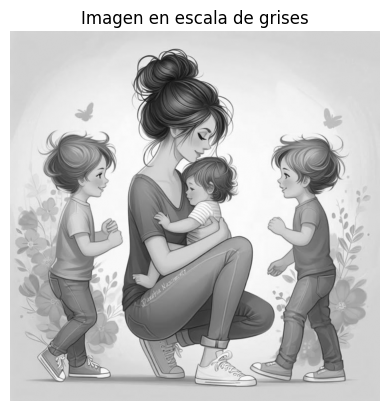

In [18]:
imagen = cv2.imread("424cce1be94ca660bc7312e3e3f56e0a.jpg", cv2.IMREAD_GRAYSCALE)

plt.imshow(imagen, cmap='gray')
plt.title("Imagen en escala de grises")
plt.axis("off")
plt.show()


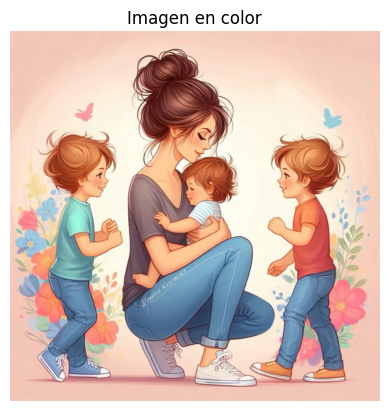

In [19]:
import cv2
import matplotlib.pyplot as plt

# Leer la imagen en color (BGR por defecto)
imagen = cv2.imread("424cce1be94ca660bc7312e3e3f56e0a.jpg")

# Convertir de BGR a RGB para mostrar correctamente con matplotlib
imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)

# Mostrar imagen
plt.imshow(imagen_rgb)
plt.title("Imagen en color")
plt.axis("off")
plt.show()


TAMAÑO DE LA IMAGEN ORIGINAL:
Alto: 344
Ancho: 710
Canales: 3

In [20]:
imagen_rgb.shape

(736, 736, 3)

a) **AplicaMOS muestreo espacial a una imagen con factores de 2, 4 y 8, ES DECIR REDUCIOMOS LA RESOLUCION DE LA IMAGEN ORIGINAL, SELECCIONANDO UNO DE CADA N PIXELES EN FILAS Y COLUMNAS. ESTO DISMINUYE EL TAMAÑO DE LA IMAGEN Y LA CANTIDAD DE DATOS , SIMULANDO UNA MENOR CALIDAD DE CAPTURA.** l

In [21]:
d = 2   # Factor de muestreo: toma 1 pixel cada 'd' pixeles
(Nx, Mx, _) = imagen.shape          # Obtiene dimensiones de imagen original, ignoring the number of channels using _
ix = range(0, Nx, d)         # Crea secuencia de 0 a Nx saltando de d en d --FILAS--
jx = range(0, Mx, d)         # Igual para columnas
Ny = len(ix)               # Nueva altura = número de filas a tomar
My = len(jx)               # Nueva anchura = número de columnas a tomar

In [22]:
# Crea nueva imagen muestreada
Y = np.zeros((Ny, My, 3), np.uint8)  # Matriz vacía de enteros 0-255, now with 3 channels for RGB
for i in range(Ny):              # Para cada fila
    for j in range(My):          # Para cada columna
        Y[i, j] = imagen[ix[i], jx[j]]  # Copia el pixel correspondiente # Replace X with imagen which contains the image data

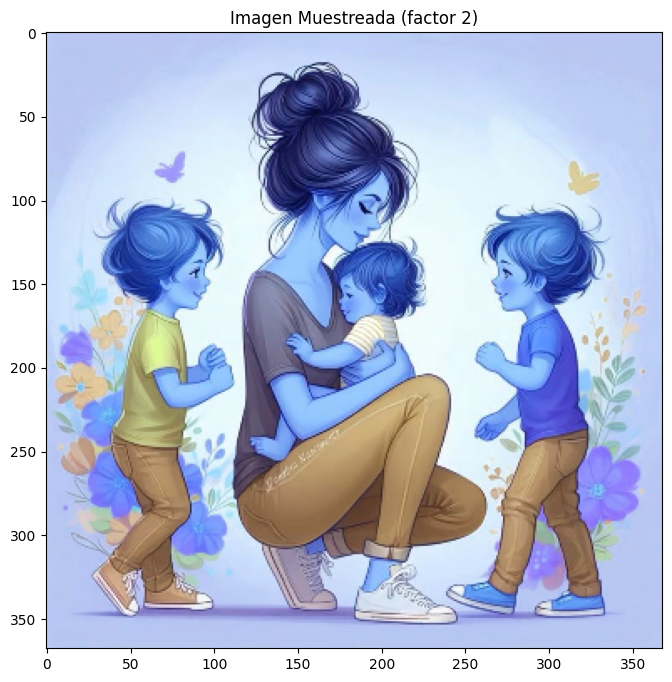

<class 'numpy.ndarray'>
Resolución reducida de 736x736 a 368x368 pixels


In [23]:
# Muestra imagen muestreada
plt.figure(figsize=(8,8))
plt.imshow(Y, cmap='gray')
plt.title(f'Imagen Muestreada (factor {d})')
plt.show()
print(type(Y))
print(f'Resolución reducida de {Nx}x{Mx} a {Ny}x{My} pixels')

In [24]:
d = 4   # Factor de muestreo: toma 1 pixel cada 'd' pixeles
(Nx, Mx, _) = imagen.shape          # Obtiene dimensiones de imagen original, ignoring channels with _
ix = range(0, Nx, d)         # Crea secuencia de 0 a Nx saltando de d en d --FILAS--
jx = range(0, Mx, d)         # Igual para columnas
Ny = len(ix)               # Nueva altura = número de filas a tomar
My = len(jx)               # Nueva anchura = número de columnas a tomar

In [25]:
# Crea nueva imagen muestreada
Y = np.zeros((Ny, My, 3), np.uint8)  # Matriz vacía de enteros 0-255, with 3 channels for RGB
for i in range(Ny):              # Para cada fila
    for j in range(My):          # Para cada columna
        Y[i, j] = imagen[ix[i], jx[j]]  # Copia el pixel correspondiente

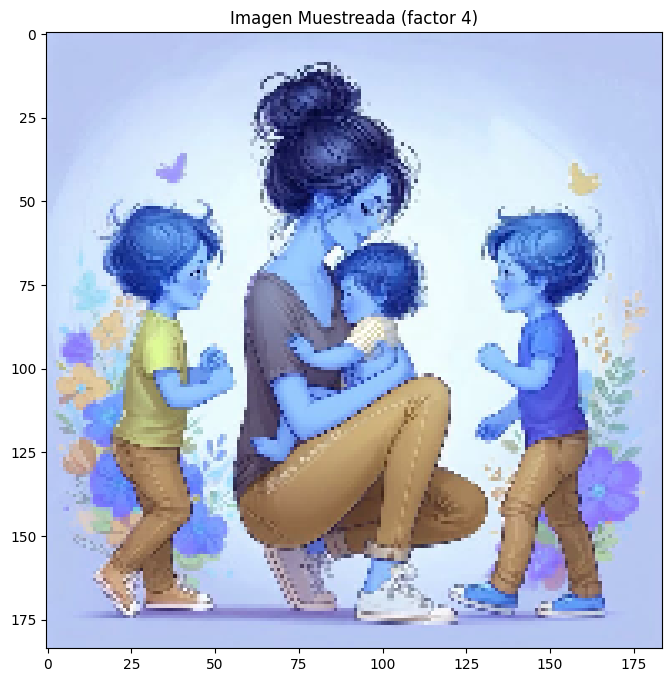

<class 'numpy.ndarray'>
Resolución reducida de 736x736 a 184x184 pixels


In [26]:
# Muestra imagen muestreada
plt.figure(figsize=(8,8))
plt.imshow(Y, cmap='gray')
plt.title(f'Imagen Muestreada (factor {d})')
plt.show()
print(type(Y))
print(f'Resolución reducida de {Nx}x{Mx} a {Ny}x{My} pixels')

In [27]:
d = 8   # Factor de muestreo: toma 1 pixel cada 'd' pixeles
(Nx, Mx, _) = imagen.shape          # Obtiene dimensiones de imagen original, ignoring channels with _
ix = range(0, Nx, d)         # Crea secuencia de 0 a Nx saltando de d en d --FILAS--
jx = range(0, Mx, d)         # Igual para columnas
Ny = len(ix)               # Nueva altura = número de filas a tomar
My = len(jx)               # Nueva anchura = número de columnas a tomar

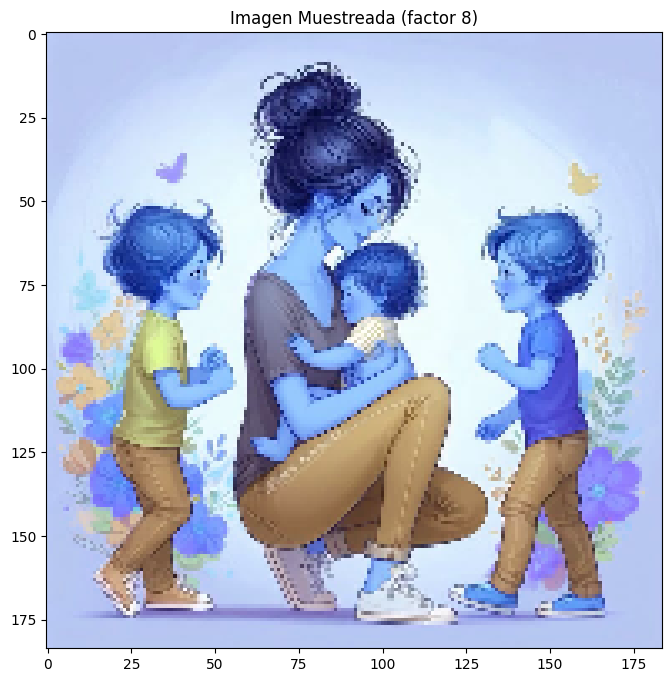

<class 'numpy.ndarray'>
Resolución reducida de 736x736 a 92x92 pixels


In [28]:
# Muestra imagen muestreada
plt.figure(figsize=(8,8))
plt.imshow(Y, cmap='gray')
plt.title(f'Imagen Muestreada (factor {d})')
plt.show()
print(type(Y))
print(f'Resolución reducida de {Nx}x{Mx} a {Ny}x{My} pixels')

**b) Para cada caso, calcular: El nuevo tamaño de la imagen El porcentaje de reducción de datos **

# b.1) Para cada caso, calcular: El nuevo tamaño de la imagen

In [29]:
for d in [2, 4, 8]:
    Nx, Mx, _ = imagen.shape  # unpack all three values, ignoring the third with _
    ix = range(0, Nx, d)
    jx = range(0, Mx, d)
    Ny = len(ix)
    My = len(jx)
    print(f"Factor {d}: nuevo tamaño = {Ny} x {My}")

Factor 2: nuevo tamaño = 368 x 368
Factor 4: nuevo tamaño = 184 x 184
Factor 8: nuevo tamaño = 92 x 92


# b.2) Para cada caso, calcular: El porcentaje de reducción de datos

In [30]:
#Porcentaje de reduccion de imagen factor 2
reduccion = 100 * (1 - (256*256)/(512*512))
print(f"Reducción de datos: {reduccion:.2f}%")


Reducción de datos: 75.00%


In [31]:
#Porcentaje de reduccion de imagen factor 4
reduccion = 100 * (1 - (128*128)/(512*512))
print(f"Reducción de datos: {reduccion:.2f}%")

Reducción de datos: 93.75%


In [32]:
#Porcentaje de reduccion de imagen factor 8
reduccion = 100 * (1 - (64*64)/(512*512))
print(f"Reducción de datos: {reduccion:.2f}%")

Reducción de datos: 98.44%


# c) Aplicar cuantización con 4 niveles diferentes (32, 64, 128, 256)

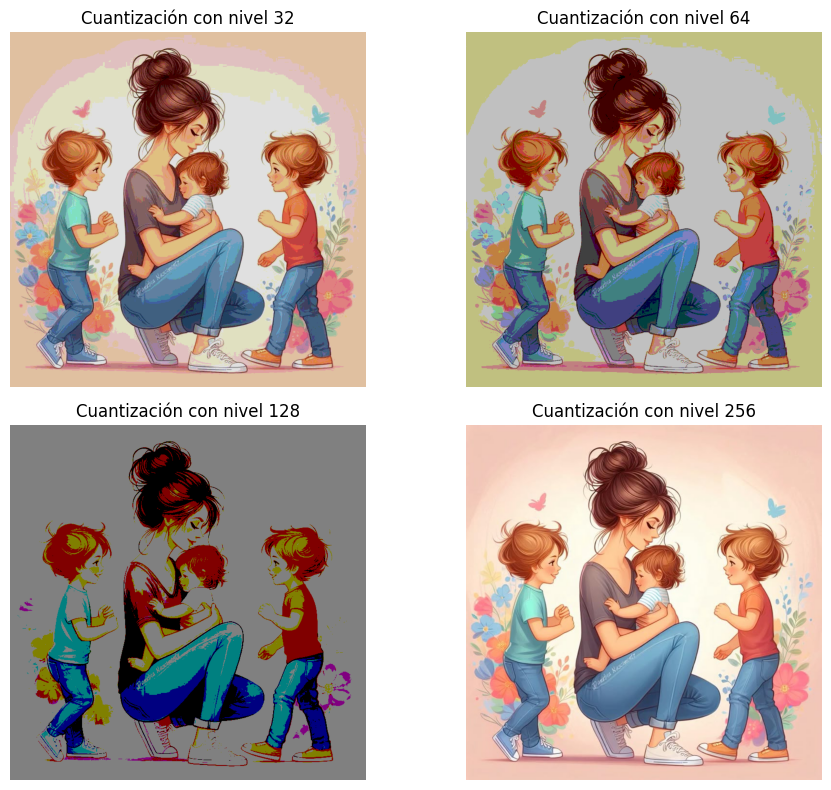

In [33]:
# Leer imagen original
url = "https://i.pinimg.com/736x/42/4c/ce/424cce1be94ca660bc7312e3e3f56e0a.jpg"
resp = urllib.request.urlopen(url)
imagen_bytes = np.asarray(bytearray(resp.read()), dtype="uint8")
imagen_bgr = cv2.imdecode(imagen_bytes, cv2.IMREAD_COLOR)

# Convertimos a RGB para que se vea correctamente con matplotlib
imagen_rgb = cv2.cvtColor(imagen_bgr, cv2.COLOR_BGR2RGB)

# Definimos los niveles de cuantización que queremos probar
niveles = [32, 64, 128, 256]

# Preparamos una figura para mostrar las 4 imágenes cuantizadas
plt.figure(figsize=(10, 8))

# Iteramos sobre cada nivel de cuantización
for i, q in enumerate(niveles):

    if q == 256:
        imagen_cuantizada = imagen_rgb.copy()  # No se modifica, ya está en su máxima calidad
    else:
        imagen_cuantizada = np.floor(imagen_rgb / q) * q

    imagen_cuantizada = imagen_cuantizada.astype(np.uint8)

    # Mostramos la imagen
    plt.subplot(2, 2, i+1)
    plt.imshow(imagen_cuantizada)
    plt.title(f'Cuantización con nivel {q}')
    plt.axis('off')

plt.tight_layout()
plt.show()


# **¿En qué nivel de cuantización comienza a ser visible la degradación de la imagen?**

**Comienza a ser visible en el nivel 32**

Consignas ejercicios 3 : Dada una imagen con objetos de diferentes colores:

a) Implementar una segmentación para extraer objetos de un color específico usando umbrales en los canales RGB.
b) Calcular y mostrar el histograma de la imagen en escala de grises.
c) Encontrar las coordenadas del rectángulo que encierra el objeto segmentado.
d) Dibujar los bordes del objeto segmentado en color rojo.**
**

# **a) Implementar una segmentación para extraer objetos de un color específico usando umbrales en los canales RGB. **

# **Ejercicio 3: Segmentación por Color**

In [34]:
# Bibliotecas necesarias
import numpy as np
import requests
from cv2 import imread
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

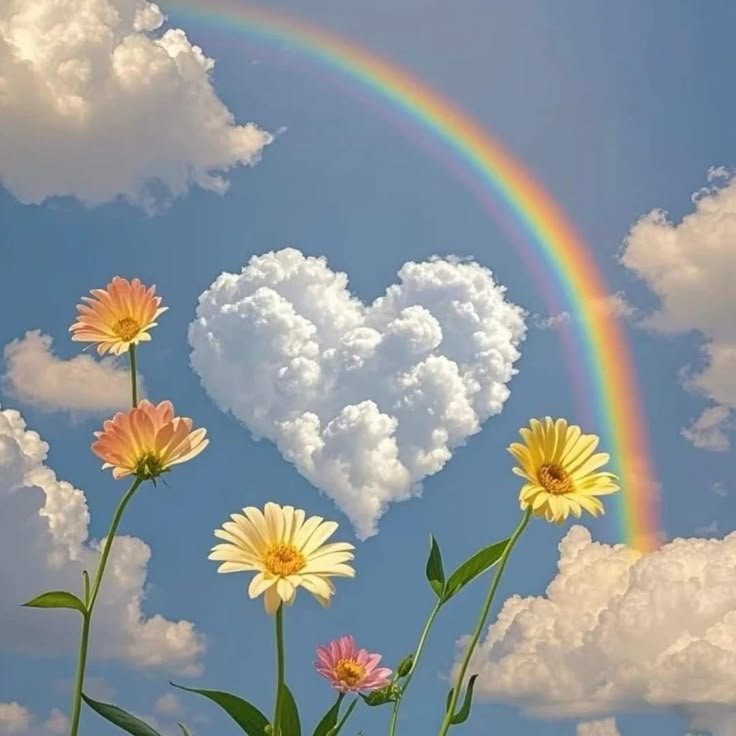

In [35]:
# Descargar la imagen desde la URL
url = 'https://i.pinimg.com/736x/a7/76/1f/a7761f51f1d64b0290d8cde29317a5e8.jpg'
response = requests.get(url)

# Leer la imagen desde los bytes de la respuesta
img_array = np.asarray(bytearray(response.content), dtype=np.uint8)
img_cv = cv2.imdecode(img_array, cv2.IMREAD_COLOR)  # Esto decodifica la imagen en formato BGR

# Mostrar la imagen
cv2_imshow(img_cv)


In [36]:
# Función para analizar características de la imagen
def info_img(img):
    print('tamaño =', img.shape)
    print('máximo =', np.max(img))
    print('mínimo =', np.min(img))

In [37]:
# Paso 2: cargarla con OpenCV
import cv2
from google.colab.patches import cv2_imshow

In [40]:
img_cv = cv2.imread("/content/arcoiris.jpg")  # esto es BGR

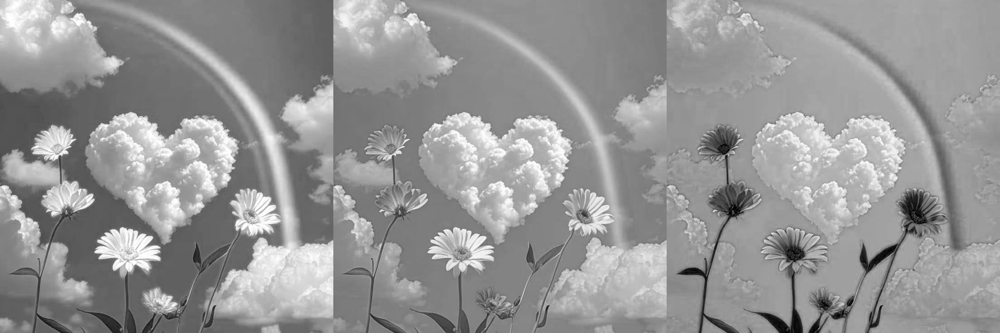

In [41]:
# Separación de canales de color
rojo = img_cv[:,:,2]   # En OpenCV: canal 2 es ROJO
verde = img_cv[:,:,1]  # canal 1 es VERDE
azul = img_cv[:,:,0]   # canal 0 es AZUL

# Concatenamos los tres canales horizontalmente
import numpy as np
canales = np.concatenate((rojo, verde, azul), axis=1)

# Mostramos la imagen resultante
from google.colab.patches import cv2_imshow
cv2_imshow(canales)


tamaño = (736, 736)
máximo = 255
mínimo = 13


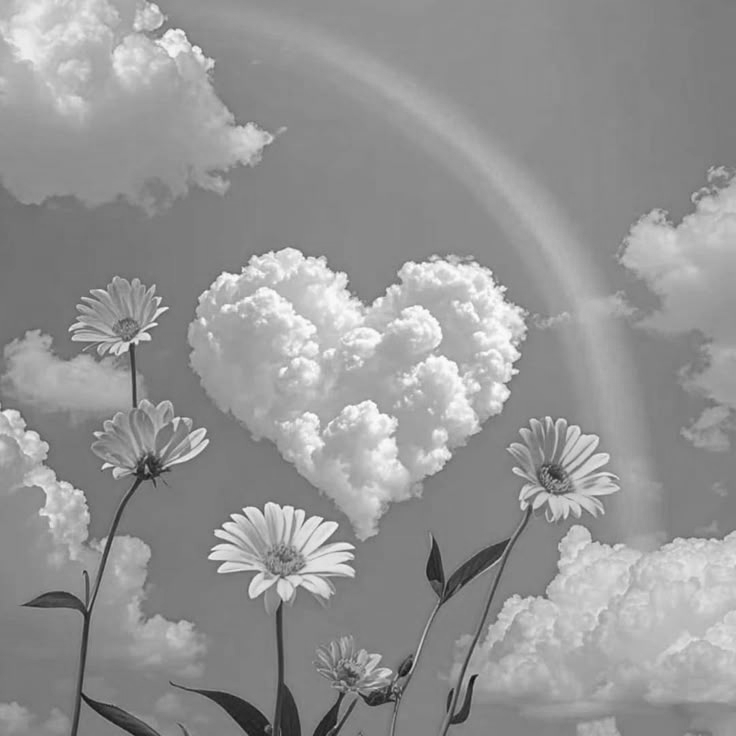

In [42]:

# Conversión a escala de grises
rojo_f = rojo.astype(float)
verde_f = verde.astype(float)
azul_f = azul.astype(float)
# Promedio ponderado
peso = (1/3,1/3,1/3)
#peso = (0.1,0.4,0.5)  # pesos alternativos
gris_f = peso[0]*rojo_f + peso[1]*verde_f + peso[2]*azul_f
gris = gris_f.astype(int)
info_img(gris)
cv2_imshow(gris)


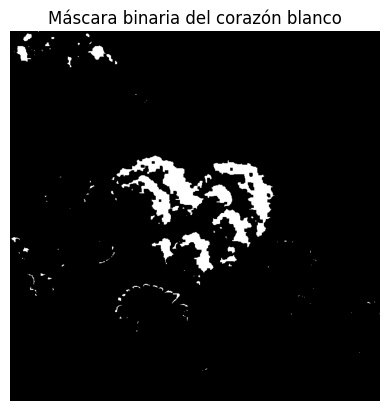

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar imagen
img_cv = cv2.imread('/content/arcoiris.jpg')
img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)

# Separar canales
azul = img_cv[:,:,0]
verde = img_cv[:,:,1]
rojo = img_cv[:,:,2]

# Umbral para blanco: alto en todos los canales
umbral = 200
seg_r = rojo > umbral #La expresión rojo > umbral verifica si el valor de cada píxel en el canal rojo es mayor que 200.
seg_v = verde > umbral #Compara los valores de cada píxel en el canal verde con el umbral de 200.
seg_a = azul > umbral

# Combinar condiciones
mascara_blanca = np.logical_and(seg_r, np.logical_and(seg_v, seg_a)).astype(np.uint8) * 255 #Detecta los píxeles blancos de una imagen.

# Morfología para mejorar máscara
kernel = np.ones((5,5), np.uint8)
mascara_limpia = cv2.morphologyEx(mascara_blanca, cv2.MORPH_CLOSE, kernel) # Limpia la máscara binaria, rellenando pequeños huecos y uniendo regiones blancas cercanas.

# Mostrar resultado
plt.imshow(mascara_limpia, cmap='gray')
plt.title("Máscara binaria del corazón blanco")
plt.axis('off')
plt.show()


# ¿Por qué se hago esto?
Este tipo de segmentación puede ser útil si quiero aislar áreas brillantes o de colores claros en la imagen (por ejemplo, para detectar objetos blancos, o para separar áreas con luz intensa). El umbral actúa como un filtro que ayuda a identificar los píxeles con una intensidad de color alta (más cerca del blanco).

PASAMOS DE BGR A RGB


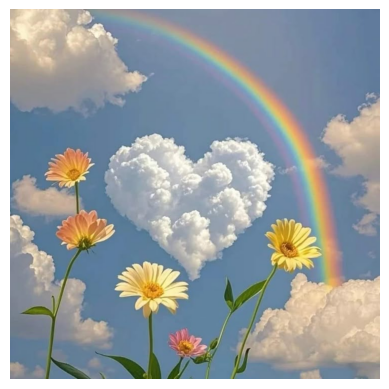

In [44]:
img = img_cv[:,:,[2,1,0]]  # BGR a RGB
 # Mostrar la imagen
plt.imshow(img)
plt.axis('off')  # Ocultar ejes
plt.show()



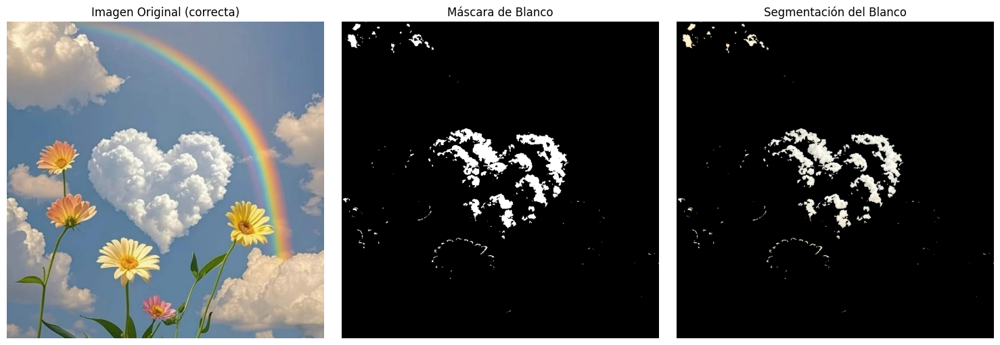

In [45]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Leer la imagen correcta
img_cv = "/content/arcoiris.jpg"
imagen = cv2.imread(img_cv)

# Verificamos que se haya cargado bien
if imagen is None:
    print("⚠️ No se pudo cargar la imagen. Verificá el nombre o si fue subida.")
else:
    # Convertir a RGB para mostrar con matplotlib
    imagen_rgb = cv2.cvtColor(imagen, cv2.COLOR_BGR2RGB)

    # Segmentar lo blanco
    lower_white = np.array([200, 200, 200])
    upper_white = np.array([255, 255, 255]) #Define un rango de colores para detectar los píxeles blancos o muy claros en una imagen RGB.

    mascara = cv2.inRange(imagen, lower_white, upper_white) #Detecta todos los píxeles dentro del rango definido (lower_white y upper_white).
    resultado = cv2.bitwise_and(imagen_rgb, imagen_rgb, mask=mascara) #Conserva solo los píxeles blancos (los que están dentro del rango).

    # Mostrar imágenes
    plt.figure(figsize=(15,5))
    plt.subplot(1, 3, 1)
    plt.imshow(imagen_rgb)
    plt.title("Imagen Original (correcta)")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(mascara, cmap='gray')
    plt.title("Máscara de Blanco")
    plt.axis("off")

    plt.subplot(1, 3, 3)
    plt.imshow(resultado)
    plt.title("Segmentación del Blanco")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


# **b) Calcular y mostrar el histograma de la imagen en escala de grises.**

### **El histograma de una imagen es una representación gráfica que muestra la distribución de los niveles de intensidad de los píxeles.**
**En el caso de imágenes en color (RGB), se puede calcular un histograma para cada canal (Rojo, Verde y Azul) por separado. Esto permite analizar cómo se distribuyen los colores en la imagen y es útil para tareas como la mejora de contraste, la segmentación o la detección de objetos por color.**


tamaño = (736, 736)
máximo = 255
mínimo = 13


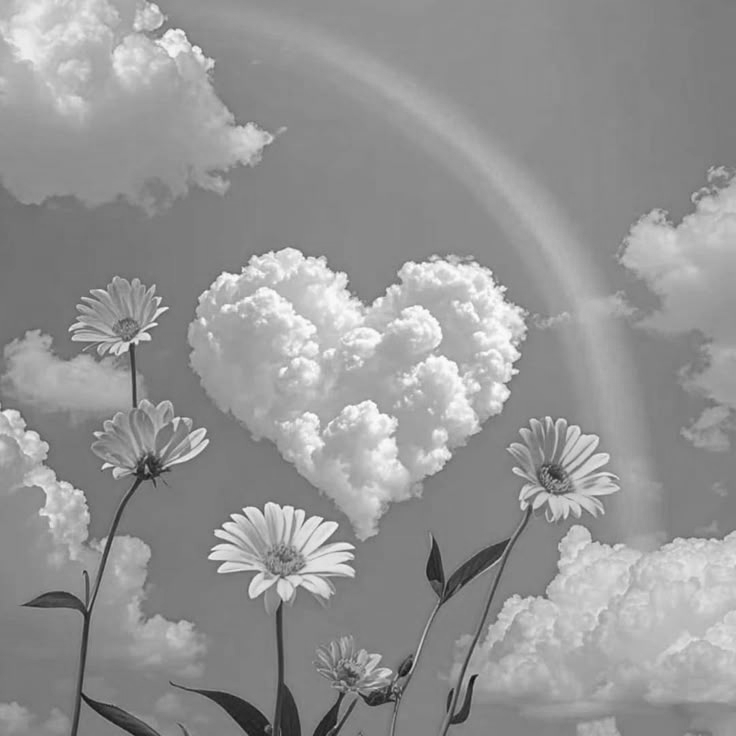

In [46]:
# Conversión a escala de grises
rojo_f = rojo.astype(float)
verde_f = verde.astype(float)
azul_f = azul.astype(float)
# Promedio ponderado
peso = (1/3,1/3,1/3)
#peso = (0.1,0.4,0.5)  # pesos alternativos
gris_f = peso[0]*rojo_f + peso[1]*verde_f + peso[2]*azul_f
gris = gris_f.astype(int)
info_img(gris)
cv2_imshow(gris)

In [47]:
# Función para mostrar histograma
def histograma(X):
    (N,M) = X.shape
    n = 256
    h = np.zeros((256,))
    for i in range(N):
        for j in range(M):
            x = X[i,j]
            h[x] = h[x]+1
    plt.plot(range(n),h[0:n])
    plt.title('Histograma')
    plt.xlabel('Valor de pixel')
    plt.ylabel('Frecuencia')
    plt.show()

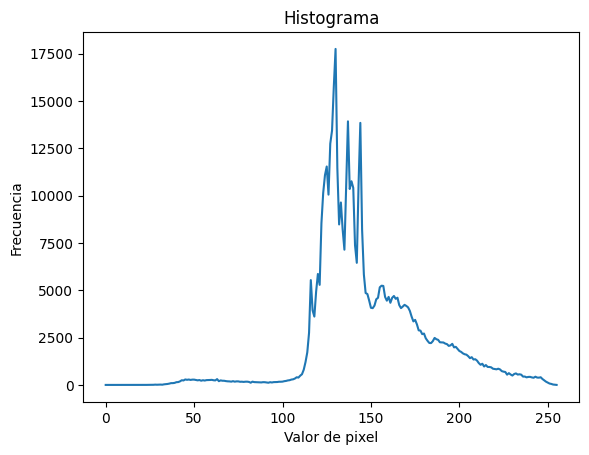

In [48]:
histograma(gris)

QUE ME MUESTRA ESTE HISTOGRAMA?

La mayor concentración de píxeles se encuentra entre los valores de 120 y 160, lo cual indica que predominan los tonos grises claros a casi blancos.

Hay algunos picos muy altos en esa zona, lo que sugiere que hay regiones bastante uniformes de ese tono (como zonas de luz o fondo claro).

En los extremos:

Valores bajos (oscuros) (0–50) aparecen poco, lo que indica que hay poca presencia de sombras profundas o zonas negras.

Valores altos (cerca de 255) tienen cierta presencia, lo que indica que hay elementos blancos o muy claros, como el maquillaje blanco o reflejos.
El histograma muestra que la imagen contiene principalmente tonos intermedios a claros, con una alta concentración en los grises claros. Esto es consistente con la apariencia de la imagen, donde predominan colores vibrantes y zonas iluminadas. La escasa presencia de valores oscuros indica que hay pocas sombras profundas.




# **c) Encontrar las coordenadas del rectángulo que encierra el objeto segmentado. **

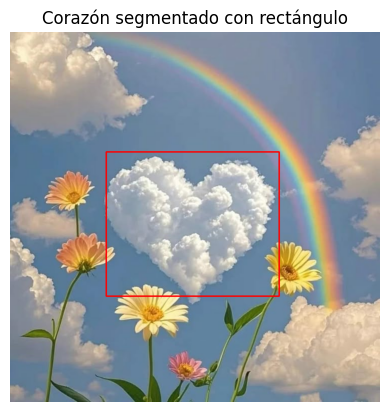

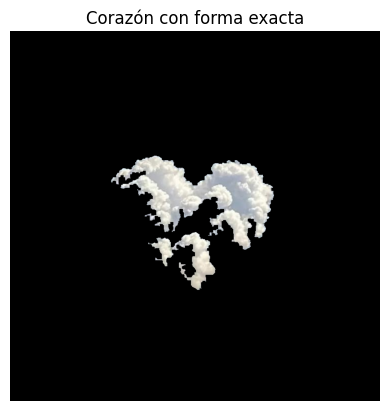

In [49]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Cargar imagen
img_cv = cv2.imread('/content/arcoiris.jpg')  # <-- asegúrate de que el path es correcto
img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_hsv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2HSV)

# ROI centrado para enfocar el análisis en el corazón
alto, ancho = img_hsv.shape[:2]
y_inicio = int(alto * 0.2)
y_fin = int(alto * 0.8)
x_inicio = int(ancho * 0.2)
x_fin = int(ancho * 0.8)
roi_hsv = img_hsv[y_inicio:y_fin, x_inicio:x_fin]

# Rango ajustado para blancos suaves
blanco_bajo = np.array([0, 0, 190])
blanco_alto = np.array([180, 30, 255])

# Máscara binaria
mascara = cv2.inRange(roi_hsv, blanco_bajo, blanco_alto)

# Morfología para cerrar huecos
kernel = np.ones((5, 5), np.uint8)
mascara = cv2.morphologyEx(mascara, cv2.MORPH_CLOSE, kernel)

# Encontrar contornos
contornos, _ = cv2.findContours(mascara, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filtrar contornos significativos
contornos_filtrados = [c for c in contornos if cv2.contourArea(c) > 1000]

if contornos_filtrados:
    # Unir todos los puntos de los contornos
    todos_puntos = np.vstack(contornos_filtrados)
    x, y, w, h = cv2.boundingRect(todos_puntos)

    # Expandir el bounding box
    margen = 10
    x_total = max(x + x_inicio - margen, 0)
    y_total = max(y + y_inicio - margen, 0)
    w = min(w + 2 * margen, img_rgb.shape[1] - x_total)
    h = min(h + 2 * margen, img_rgb.shape[0] - y_total)

    # Dibujar el rectángulo
    img_resultado = img_rgb.copy()
    cv2.rectangle(img_resultado, (x_total, y_total), (x_total + w, y_total + h), (255, 0, 0), 2)
    plt.imshow(img_resultado)
    plt.title("Corazón segmentado con rectángulo")
    plt.axis('off')
    plt.show()

    # --- Recorte con forma exacta (máscara) ---
    # Crear una máscara vacía en el ROI
    mascara_corazon = np.zeros_like(mascara)
    cv2.drawContours(mascara_corazon, contornos_filtrados, -1, 255, thickness=cv2.FILLED)

    # Llevar la máscara al tamaño de la imagen original
    mascara_completa = np.zeros(img_rgb.shape[:2], dtype=np.uint8)
    mascara_completa[y_inicio:y_fin, x_inicio:x_fin] = mascara_corazon

    # Aplicar la máscara a la imagen original
    corazon_forma = cv2.bitwise_and(img_rgb, img_rgb, mask=mascara_completa)
    plt.imshow(corazon_forma)
    plt.title("Corazón con forma exacta")
    plt.axis('off')
    plt.show()
else:
    print("No se encontraron contornos significativos.")


# **d) Dibujar los bordes del objeto segmentado en color rojo.**

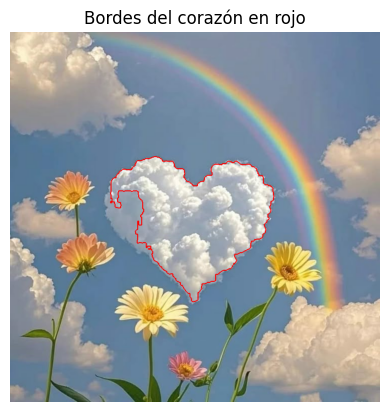

In [67]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 1. Leer y convertir imagen
img_cv = cv2.imread('/content/arcoiris.jpg')
img_rgb = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)
img_hsv = cv2.cvtColor(img_cv, cv2.COLOR_BGR2HSV)

# 2. Crear máscara binaria para blanco (en HSV)
blanco_bajo = np.array([0, 0, 170])
blanco_alto = np.array([180, 30, 255])
mascara = cv2.inRange(img_hsv, blanco_bajo, blanco_alto)

# 3. Morfología para limpiar
kernel = np.ones((5, 5), np.uint8)
mascara = cv2.morphologyEx(mascara, cv2.MORPH_CLOSE, kernel)

# 4. Buscar contornos
contornos, _ = cv2.findContours(mascara, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
contornos_filtrados = [c for c in contornos if cv2.contourArea(c) > 1000]

# 5. Si hay contornos válidos, tomamos el más grande
if contornos_filtrados:
    contorno_principal = max(contornos_filtrados, key=cv2.contourArea)

    # 6. Crear máscara limpia SOLO del corazón
    limpia = np.zeros_like(mascara)
    cv2.drawContours(limpia, [contorno_principal], -1, 1, thickness=cv2.FILLED)

    # 7. Detectar bordes en esa máscara del corazón
    N, M = limpia.shape
    borde = np.zeros((N, M), np.uint8)

    for i in range(N):
        for j in range(1, M):
            if limpia[i, j] != limpia[i, j - 1]:
                borde[i, j] = 1
                borde[i, j - 1] = 1
    for i in range(1, N):
        for j in range(M):
            if limpia[i, j] != limpia[i - 1, j]:
                borde[i, j] = 1
                borde[i - 1, j] = 1

    # 8. Dibujar bordes en rojo sobre la imagen
    img_bordes_rojos = img_rgb.copy()
    img_bordes_rojos[borde == 1] = [255, 0, 0]

    # 9. Mostrar resultado
    plt.imshow(img_bordes_rojos)
    plt.title("Bordes del corazón en rojo")
    plt.axis('off')
    plt.show()

else:
    print("No se encontró el contorno del corazón.")



DESENFOQUE BLUR
(7, 7): tamaño del kernel (tiene que ser impar, como 3, 5, 7...). Cuanto más grande, más desenfoca.

0: es el desvío estándar en X y Y (si lo ponés en 0, OpenCV lo calcula automáticamente).



In [58]:
imagen_blur = cv2.GaussianBlur(imagen, (7, 7), 0)


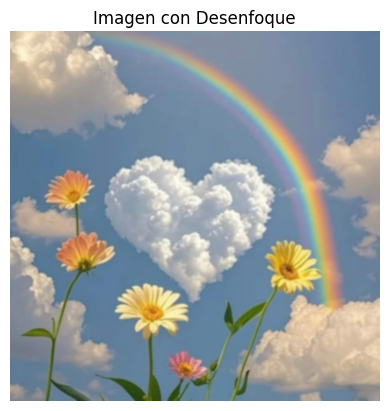

In [59]:
import matplotlib.pyplot as plt

plt.imshow(cv2.cvtColor(imagen_blur, cv2.COLOR_BGR2RGB))
plt.title("Imagen con Desenfoque")
plt.axis("off")
plt.show()


In [68]:
imagen_blur = cv2.GaussianBlur(imagen, (31, 31), 0)

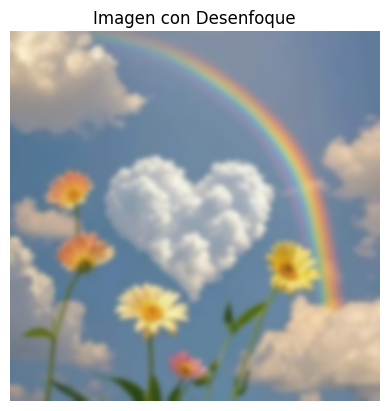

In [69]:
plt.imshow(cv2.cvtColor(imagen_blur, cv2.COLOR_BGR2RGB))
plt.title("Imagen con Desenfoque")
plt.axis("off")
plt.show()